In [1]:

Group NAme:
    
    

In [1]:
import os
import random
import shutil
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, models, transforms
from torchvision.utils import save_image
import matplotlib.cm as cm

In [2]:
a = torch.ones(1).cuda()

In [3]:
torch.cuda.is_available()

True

## Dataset

This link guide I used to load dataset: https://pytorch.org/vision/0.16/generated/torchvision.datasets.LFWPeople.html

In [4]:
# Downloading and Loading Dataset
mnist_tf = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((64, 64)),
        # transforms.Pad(2),
    ])

# train + valid splits
dataset = datasets.LFWPeople(root='./data/train', split="train", transform=mnist_tf,download=True)
# calculating split size as dataset contain 9525 images in training set so spliting it with 80:20 ration for training and validation set
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)  
val_size = dataset_size - train_size  
train_img_dataset, val_img_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# eval set
test_img_dataset = datasets.LFWPeople(root='./data/test', split="test", transform=mnist_tf, download=True)

Files already downloaded and verified
Files already downloaded and verified


In [5]:

print(f"Total training dataset size: {len(dataset)}")
print(f"Total train_img dataset size: {len(train_img_dataset)}")
print(f"Total val_img dataset size: {len(val_img_dataset)}")
print(f"Total test_img dataset size: {len(test_img_dataset)}")


Total training dataset size: 9525
Total train_img dataset size: 7620
Total val_img dataset size: 1905
Total test_img dataset size: 3708


In [6]:
# Checking the size of the image as we need to know for model's input layer the height and width will be written in in_spatial parameter 
image, label = train_img_dataset[0]
print("Image size:", image.size())

Image size: torch.Size([3, 64, 64])


/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [7]:
class TripletDataset:
    """
    Dataset class from which we sample random triplets
    """
    def __init__(self, dataset):
        """ Dataset initializer"""
        self.dataset = dataset
        self.arange = np.arange(len(dataset))
        self.labels = torch.Tensor([l for _,l in dataset])
        return
    
    def __len__(self):
        """ Returning number of anchors """
        return len(self.dataset)

    def __getitem__(self, i):
        """ 
        Sampling a triplet for the dataset. Index i corresponds to anchor 
        """
        # sampling anchor
        anchor_img, anchor_lbl = self.dataset[i]

        # lists for positives and negatives
        pos_ids = self.arange[self.labels == anchor_lbl].tolist()
        neg_id = self.arange[self.labels != anchor_lbl].tolist()
        
        # Checking if pos_ids and neg_ids are not empty to debug the error I am getting in visualisation 
        assert len(pos_ids), "No positive examples found."
        assert len(neg_id), "No negative examples found."
        
        # random positive and negative
        # BIG FLAW HERE! 
        pos_id = random.choice(pos_ids) if len(pos_ids) > 1 else pos_ids[0]
        neg_id = random.choice(neg_id) if len(neg_id) > 1 else neg_id[0] 
        pos_img, pos_lbl = self.dataset[pos_id] 
        neg_img, neg_lbl = self.dataset[neg_id]
              
        return (anchor_img, pos_img, neg_img), (anchor_lbl, pos_lbl, neg_lbl)

In [8]:
train_dataset = TripletDataset(train_img_dataset)
val_dataset = TripletDataset(val_img_dataset)
test_dataset = TripletDataset(test_img_dataset)

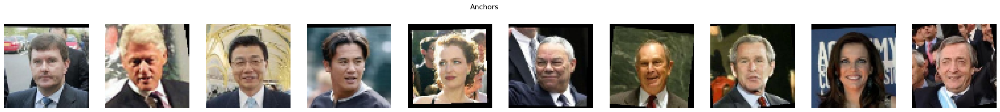

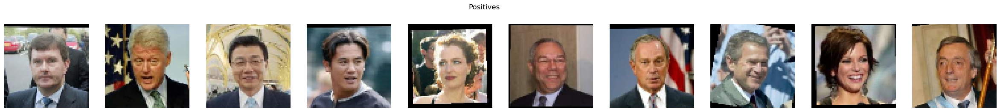

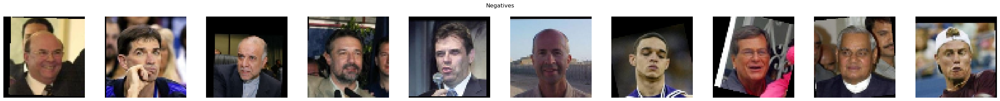

In [9]:
fig_anchors, anchors = plt.subplots(1, 10, figsize=(30, 3))
fig_pos, positives = plt.subplots(1, 10, figsize=(30, 3))
fig_neg, negatives = plt.subplots(1, 10, figsize=(30, 3))

for i in range(10):
    (anchor, positive, negative), _ = val_dataset[i]
    
    # Permute the tensor dimensions from [C, H, W] to [H, W, C]
    anchor_img = anchor.permute(1, 2, 0).numpy()
    positive_img = positive.permute(1, 2, 0).numpy()
    negative_img = negative.permute(1, 2, 0).numpy()
    
    anchors[i].imshow(anchor_img)
    anchors[i].axis("off")
    positives[i].imshow(positive_img)
    positives[i].axis("off")
    negatives[i].imshow(negative_img)
    negatives[i].axis("off")

fig_anchors.suptitle("Anchors")
fig_pos.suptitle("Positives")
fig_neg.suptitle("Negatives")

plt.tight_layout()


In [10]:
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=64, shuffle=True) 
valid_loader = torch.utils.data.DataLoader(dataset=val_dataset, batch_size=64, shuffle=True) 
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=64, shuffle=False) 

## Utils

In [11]:
# utils

def smooth(f, K=5):
    """ Smoothing a function using a low-pass filter (mean) of size K """
    kernel = np.ones(K) / K
    f = np.concatenate([f[:int(K//2)], f, f[int(-K//2):]])  # to account for boundaries
    smooth_f = np.convolve(f, kernel, mode="same")
    smooth_f = smooth_f[K//2: -K//2]  # removing boundary-fixes
    return smooth_f


def save_model(model, optimizer, epoch, stats, margin):
    """ Saving model checkpoint """
    
    if(not os.path.exists("ResnetModel")):
        os.makedirs("ResnetModel")
    savepath = f"ResnetModel/checkpoint_epoch_{epoch}_margin_{margin}.pth"

    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'stats': stats
    }, savepath)
    return


def load_model(model, optimizer, savepath):
    """ Loading pretrained checkpoint """
    
    checkpoint = torch.load(savepath, map_location="cpu")
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint["epoch"]
    stats = checkpoint["stats"]
    
    return model, optimizer, epoch, stats


def count_model_params(model):
    """ Counting the number of learnable parameters in a nn.Module """
    num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return num_params

def visualize_progress(train_loss, val_loss, start=0):
    """ Visualizing loss and accuracy """
    fig, ax = plt.subplots(1,3)
    fig.set_size_inches(24,5)

    smooth_train = smooth(train_loss, 31)
    ax[0].plot(train_loss, c="blue", label="Loss", linewidth=3, alpha=0.5)
    ax[0].plot(smooth_train, c="red", label="Smoothed Loss", linewidth=3, alpha=1)
    ax[0].legend(loc="best")
    ax[0].set_xlabel("Iteration")
    ax[0].set_ylabel("CE Loss")
    ax[0].set_yscale("linear")
    ax[0].set_title("Training Progress (linear)")
    
    ax[1].plot(train_loss, c="blue", label="Loss", linewidth=3, alpha=0.5)
    ax[1].plot(smooth_train, c="red", label="Smoothed Loss", linewidth=3, alpha=1)
    ax[1].legend(loc="best")
    ax[1].set_xlabel("Iteration")
    ax[1].set_ylabel("CE Loss")
    ax[1].set_yscale("log")
    ax[1].set_title("Training Progress (log)")

    smooth_val = smooth(val_loss, 31)
    N_ITERS = len(val_loss)
    ax[2].plot(np.arange(start, N_ITERS)+start, val_loss[start:], c="blue", label="Loss", linewidth=3, alpha=0.5)
    ax[2].plot(np.arange(start, N_ITERS)+start, smooth_val[start:], c="red", label="Smoothed Loss", linewidth=3, alpha=1)
    ax[2].legend(loc="best")
    ax[2].set_xlabel("Iteration")
    ax[2].set_ylabel("CE Loss")
    ax[2].set_yscale("log")
    ax[2].set_title(f"Valid Progress")

    return

def display_projections(points, labels, ax=None, legend=None):
    """ Displaying low-dimensional data projections """
    
# Generating a unique color for each class using a colormap
    unique_labels = np.unique(labels)
    color_map = cm.get_cmap('hsv', len(unique_labels))
    
    if legend is None:
        legend = [f"Class {l}" for l in unique_labels]

    if ax is None:
        _, ax = plt.subplots(1, 1, figsize=(20, 6))
    
    for i, label in enumerate(unique_labels):
        idx = np.where(labels == label)
        # Using the color_map to get a color for each label as the unique labels are too many that i can not specify manually 
        color = np.array([color_map(i / len(unique_labels))])
        ax.scatter(points[idx, 0], points[idx, 1], label=legend[i], color=color)
    
    ax.legend(loc="best", ncol=2, fontsize='small')

# def display_projections(points, labels, ax=None, legend=None):
#    """ Displaying low-dimensional data projections """
    
#    COLORS = ['r', 'b', 'g', 'y', 'purple', 'orange', 'k', 'brown', 'grey',
 #             'c', "gold", "fuchsia", "lime", "darkred", "tomato", "navy"]
    
  #  legend = [f"Class {l}" for l in np.unique(labels)] if legend is None else legend
   # if(ax is None):
#        _, ax = plt.subplots(1,1,figsize=(12,6))
    
#    for i,l in enumerate(np.unique(labels)):
#        idx = np.where(l==labels)

 #       ax.scatter(points[idx, 0], points[idx, 1], label=legend[int(l)], c=COLORS[i])
  #  ax.legend(loc="best") 


## Siamese Model

In [12]:
class NormLayer(nn.Module):
    """ Layer that computer embedding normalization """
    def __init__(self, l=2):
        """ Layer initializer """
        assert l in [1, 2]
        super().__init__()
        self.l = l
        return
    
    def forward(self, x):
        """ Normalizing embeddings x. The shape of x is (B,D) """
        x_normalized = x / torch.norm(x, p=self.l, dim=-1, keepdim=True)
        return x_normalized

## Resnet Backbone custom Function by removing layers of resnet18 until AvgPooling 

This link helped me to understand how to remove last layers from renset18 architecture:
https://discuss.pytorch.org/t/how-to-delete-layer-in-pretrained-model/17648

In [13]:
    
class ResNetBackbone(nn.Module):
    def __init__(self, pretrained=False):
        super().__init__()
        
        # Load a pretrained ResNet18 model accordingly (pretrained to control while creating model instance)
        resnet18 = models.resnet18(pretrained=pretrained)

        # Removing the last fully connected layer and the average pooling layer as it was required in the task
        self.block = nn.Sequential(*list(resnet18.children())[:-2])

    def forward(self, x):
        return self.block(x)
       

class SiameseModel(nn.Module):
    """ 
    Implementation of a simple siamese model 
    """
    def __init__(self, emb_dim=32, channels=[3, 64, 128, 256, 512], in_spatial=(64, 64), pretrained=False):
        """ Module initializer """
        super().__init__()
        
        self.resnet18 = ResNetBackbone(pretrained=pretrained)  
        
        # Reduction factor for ResNet18
        reduction_factor = 32
        # AFter this we need to calculate the output spatial dimensions using the reduction factor of resnet18
        out_spatial_dim = (in_spatial[0] // reduction_factor, in_spatial[1] // reduction_factor)

        # fully connected embedder
        flat_dim = channels[4] * out_spatial_dim[0] * out_spatial_dim[1]
        self.fc = nn.Linear(flat_dim, emb_dim)

        # auxiliar layers
        self.flatten = nn.Flatten()
        self.norm = NormLayer()
        
        return
    
    def forward_one(self, x):
        """ Forwarding just one sample through the model """
        x = self.resnet18(x)
        x_flat = self.flatten(x)
        x_emb = self.fc(x_flat)
        x_emb_norm = self.norm(x_emb)
        return x_emb_norm
    
    def forward(self, anchor, positive, negative):
        """ Forwarding a triplet """
        anchor_emb = self.forward_one(anchor)
        positive_emb = self.forward_one(positive)
        negative_emb = self.forward_one(negative)
        
        # is there a more efficient way?
        # imgs = torch.concat([anchor, positive, negative], dim=0)
        # embs = self.forward_one(imgs)
        # anchor_emb, positive_emb, negative_emb = torch.chunk(embs, 3, dim=0)
        
        return anchor_emb, positive_emb, negative_emb

In [14]:

resnetPreTrainedModel = SiameseModel(pretrained=True)

/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [15]:
print(f"Model has {count_model_params(resnetPreTrainedModel)} parameters")
resnetPreTrainedModel

Model has 11242080 parameters


SiameseModel(
  (resnet18): ResNetBackbone(
    (block): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64

## Training

In [16]:
class TripletLoss(nn.Module):
    """ Implementation of the triplet loss function """
    def __init__(self, margin=0.2, reduce="mean"):
        """ Module initializer """
        assert reduce in ["mean", "sum"]
        super().__init__()
        self.margin = margin
        self.reduce = reduce
        return
        
    def forward(self, anchor, positive, negative):
        """ Computing pairwise distances and loss functions """
        # L2 distances
        d_ap = (anchor - positive).pow(2).sum(dim=-1)
        d_an = (anchor - negative).pow(2).sum(dim=-1)
        
        # triplet loss function
        loss = (d_ap - d_an + self.margin)
        loss = torch.maximum(loss, torch.zeros_like(loss))
        
        # averaging or summing      
        loss = torch.mean(loss) if(self.reduce == "mean") else torch.sum(loss)
      
        return loss

In [17]:
class Trainer:
    """
    Class for training and validating a siamese model
    """
    
    def __init__(self, model, criterion, train_loader, valid_loader, n_iters=1e4):
        """ Trainer initializer """
        self.model = model
        self.criterion = criterion
        self.train_loader = train_loader
        self.valid_loader = valid_loader
        
        self.n_iters = int(n_iters)
        self.optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-5)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model.to(self.device)
        
        self.train_loss = []
        self.valid_loss = []
        return
    
    @torch.no_grad()
    def valid_step(self, val_iters=100):
        """ Some validation iterations """
        self.model.eval()
        cur_losses = []
        for i, ((anchors, positives, negatives),_) in enumerate(self.valid_loader):   
            # setting inputs to GPU
            anchors = anchors.to(self.device)
            positives = positives.to(self.device)
            negatives = negatives.to(self.device)
            
            # forward pass and triplet loss
            anchor_emb, positive_emb, negative_emb = self.model(anchors, positives, negatives)
            loss = self.criterion(anchor_emb, positive_emb, negative_emb)
            cur_losses.append(loss.item())
            
            if(i >= val_iters):
                break
    
        self.valid_loss += cur_losses
        self.model.train()
        
        return cur_losses
    
    def fit(self):
        """ Train/Validation loop """
    
        self.iter_ = 0
        progress_bar = tqdm(total=self.n_iters, initial=0)
        
        for i in range(self.n_iters):
            for (anchors, positives, negatives), _ in self.train_loader:     
                # setting inputs to GPU
                anchors = anchors.to(self.device)
                positives = positives.to(self.device)
                negatives = negatives.to(self.device)
                
                # forward pass and triplet loss
                anchor_emb, positive_emb, negative_emb = self.model(anchors, positives, negatives)
                loss = self.criterion(anchor_emb, positive_emb, negative_emb)
                self.train_loss.append(loss.item())
                
                # optimization
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
            
                # updating progress bar
                progress_bar.set_description(f"Train Iter {self.iter_}: Loss={round(loss.item(),5) }")
                
                # doing some validation every once in a while
                if(self.iter_ % 250 == 0):
                    cur_losses = self.valid_step()
                    print(f"Valid loss @ iteration {self.iter_}: Loss={np.mean(cur_losses)}")
                
                self.iter_ = self.iter_+1 
                if(self.iter_ >= self.n_iters):
                    break
            if(self.iter_ >= self.n_iters):
                break
        return

## Fine-tuned TriNet (pretrained ResNet)

In [18]:
resnetPreTrainedModel = SiameseModel(pretrained=True)
criterion = TripletLoss(margin=0.2)

In [19]:
ResnetPTMtrainer = Trainer(model=resnetPreTrainedModel, criterion=criterion, train_loader=train_loader, valid_loader=valid_loader, n_iters=5000)

In [20]:
ResnetPTMtrainer.fit()

Train Iter 0: Loss=0.15447:   0%|                                                              | 0/5000 [00:03<?, ?it/s]

Valid loss @ iteration 0: Loss=0.07050377565125625


Train Iter 250: Loss=0.03981:   0%|                                                            | 0/5000 [01:18<?, ?it/s]

Valid loss @ iteration 250: Loss=0.03650140687823296


Train Iter 500: Loss=0.02464:   0%|                                                            | 0/5000 [02:59<?, ?it/s]

Valid loss @ iteration 500: Loss=0.026621966374417147


Train Iter 750: Loss=0.01882:   0%|                                                            | 0/5000 [04:31<?, ?it/s]

Valid loss @ iteration 750: Loss=0.02099827458926787


Train Iter 1000: Loss=0.0243:   0%|                                                            | 0/5000 [05:44<?, ?it/s]

Valid loss @ iteration 1000: Loss=0.016456016331600647


Train Iter 1250: Loss=0.01157:   0%|                                                           | 0/5000 [06:58<?, ?it/s]

Valid loss @ iteration 1250: Loss=0.018226002800899248


Train Iter 1500: Loss=0.02006:   0%|                                                           | 0/5000 [08:09<?, ?it/s]

Valid loss @ iteration 1500: Loss=0.015516331093385816


Train Iter 1750: Loss=0.01345:   0%|                                                           | 0/5000 [09:21<?, ?it/s]

Valid loss @ iteration 1750: Loss=0.012844183140744765


Train Iter 2000: Loss=0.00941:   0%|                                                           | 0/5000 [10:36<?, ?it/s]

Valid loss @ iteration 2000: Loss=0.015126847452484072


Train Iter 2250: Loss=0.01639:   0%|                                                           | 0/5000 [11:47<?, ?it/s]

Valid loss @ iteration 2250: Loss=0.017652320737640063


Train Iter 2500: Loss=0.00644:   0%|                                                           | 0/5000 [13:02<?, ?it/s]

Valid loss @ iteration 2500: Loss=0.01667615631595254


Train Iter 2750: Loss=0.01542:   0%|                                                           | 0/5000 [14:16<?, ?it/s]

Valid loss @ iteration 2750: Loss=0.018042701955225008


Train Iter 3000: Loss=0.01109:   0%|                                                           | 0/5000 [15:27<?, ?it/s]

Valid loss @ iteration 3000: Loss=0.015636722510680556


Train Iter 3250: Loss=0.00254:   0%|                                                           | 0/5000 [16:40<?, ?it/s]

Valid loss @ iteration 3250: Loss=0.015134280058555305


Train Iter 3500: Loss=0.00641:   0%|                                                           | 0/5000 [17:50<?, ?it/s]

Valid loss @ iteration 3500: Loss=0.019210950254152218


Train Iter 3750: Loss=0.02728:   0%|                                                           | 0/5000 [18:59<?, ?it/s]

Valid loss @ iteration 3750: Loss=0.015773114988890787


Train Iter 4000: Loss=0.0:   0%|                                                               | 0/5000 [20:21<?, ?it/s]

Valid loss @ iteration 4000: Loss=0.013743095099925995


Train Iter 4250: Loss=0.00115:   0%|                                                           | 0/5000 [21:45<?, ?it/s]

Valid loss @ iteration 4250: Loss=0.012948951497673989


Train Iter 4500: Loss=0.0055:   0%|                                                            | 0/5000 [23:01<?, ?it/s]

Valid loss @ iteration 4500: Loss=0.013574948483922829


Train Iter 4750: Loss=0.00566:   0%|                                                           | 0/5000 [24:34<?, ?it/s]

Valid loss @ iteration 4750: Loss=0.015718090534210204


Train Iter 4999: Loss=0.00127:   0%|                                                           | 0/5000 [26:19<?, ?it/s]


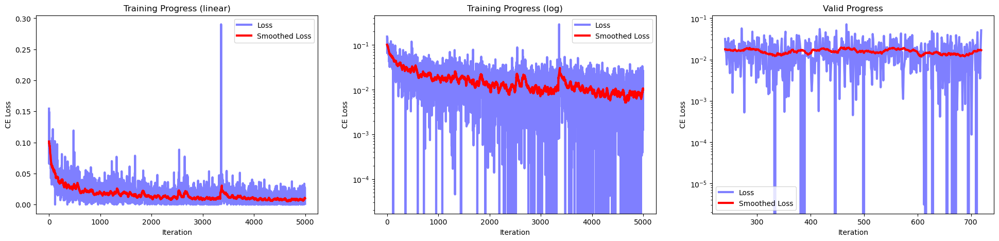

In [21]:
visualize_progress(ResnetPTMtrainer.train_loss, ResnetPTMtrainer.valid_loss, start=120)
plt.show()

In [22]:
stats = {
    "train_loss": ResnetPTMtrainer.train_loss,
    "valid_loss": ResnetPTMtrainer.valid_loss
}
save_model(ResnetPTMtrainer.model, ResnetPTMtrainer.optimizer, ResnetPTMtrainer.iter_, stats, margin=0.2)

## TriNet initialized with random weights / Fine-tuned TriNet (fine-tuned ResNet, not pretrained)

In [23]:
resnetRandomWeightsModel = SiameseModel(pretrained=False)
criterion = TripletLoss(margin=0.2)

/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [24]:
ResnetRWMtrainer = Trainer(model=resnetRandomWeightsModel, criterion=criterion, train_loader=train_loader, valid_loader=valid_loader, n_iters=5000)

In [25]:
ResnetRWMtrainer.fit()

  0%|                                                                                          | 0/5000 [00:00<?, ?it/s]/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
Train Iter 0: Loss=0.1125:   0%|                                                               | 0/5000 [00:00<?, ?it/s]

Valid loss @ iteration 0: Loss=0.08596627041697502


Train Iter 250: Loss=0.04155:   0%|                                                            | 0/5000 [02:12<?, ?it/s]

Valid loss @ iteration 250: Loss=0.045601865742355585


Train Iter 500: Loss=0.14746:   0%|                                                            | 0/5000 [04:19<?, ?it/s]

Valid loss @ iteration 500: Loss=0.0490249065682292


Train Iter 750: Loss=0.04079:   0%|                                                            | 0/5000 [06:10<?, ?it/s]

Valid loss @ iteration 750: Loss=0.03439229099700848


Train Iter 1000: Loss=0.04212:   0%|                                                           | 0/5000 [08:02<?, ?it/s]

Valid loss @ iteration 1000: Loss=0.027450661826878785


Train Iter 1250: Loss=0.02242:   0%|                                                           | 0/5000 [09:49<?, ?it/s]

Valid loss @ iteration 1250: Loss=0.027981837520686288


Train Iter 1500: Loss=0.01908:   0%|                                                           | 0/5000 [11:33<?, ?it/s]

Valid loss @ iteration 1500: Loss=0.02264591895509511


Train Iter 1750: Loss=0.04319:   0%|                                                           | 0/5000 [13:10<?, ?it/s]

Valid loss @ iteration 1750: Loss=0.024246073498701056


Train Iter 2000: Loss=0.03805:   0%|                                                           | 0/5000 [14:48<?, ?it/s]

Valid loss @ iteration 2000: Loss=0.023317412535349528


Train Iter 2250: Loss=0.00844:   0%|                                                           | 0/5000 [16:24<?, ?it/s]

Valid loss @ iteration 2250: Loss=0.02142995179941257


Train Iter 2500: Loss=0.00985:   0%|                                                           | 0/5000 [18:03<?, ?it/s]

Valid loss @ iteration 2500: Loss=0.020509302693729598


Train Iter 2750: Loss=0.01854:   0%|                                                           | 0/5000 [19:42<?, ?it/s]

Valid loss @ iteration 2750: Loss=0.02104561044058452


Train Iter 3000: Loss=0.0188:   0%|                                                            | 0/5000 [21:18<?, ?it/s]

Valid loss @ iteration 3000: Loss=0.02507940713160982


Train Iter 3250: Loss=0.01562:   0%|                                                           | 0/5000 [22:53<?, ?it/s]

Valid loss @ iteration 3250: Loss=0.02837466533916692


Train Iter 3500: Loss=0.00926:   0%|                                                           | 0/5000 [24:27<?, ?it/s]

Valid loss @ iteration 3500: Loss=0.02400780705890308


Train Iter 3750: Loss=0.01259:   0%|                                                           | 0/5000 [25:59<?, ?it/s]

Valid loss @ iteration 3750: Loss=0.0237363681041946


Train Iter 4000: Loss=0.03868:   0%|                                                           | 0/5000 [27:23<?, ?it/s]

Valid loss @ iteration 4000: Loss=0.02169685052552571


Train Iter 4250: Loss=0.01913:   0%|                                                           | 0/5000 [29:16<?, ?it/s]

Valid loss @ iteration 4250: Loss=0.020234105177223682


Train Iter 4500: Loss=0.00757:   0%|                                                           | 0/5000 [31:37<?, ?it/s]

Valid loss @ iteration 4500: Loss=0.0217419633641839


Train Iter 4750: Loss=0.00761:   0%|                                                           | 0/5000 [33:53<?, ?it/s]

Valid loss @ iteration 4750: Loss=0.022144061249370375


Train Iter 4999: Loss=0.0252:   0%|                                                            | 0/5000 [35:33<?, ?it/s]


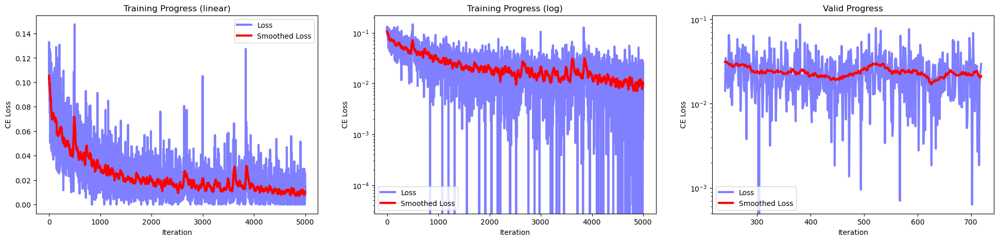

In [26]:
visualize_progress(ResnetRWMtrainer.train_loss, ResnetRWMtrainer.valid_loss, start=120)
plt.show()

In [27]:
stats = {
    "train_loss": ResnetRWMtrainer.train_loss,
    "valid_loss": ResnetRWMtrainer.valid_loss
}
save_model(ResnetRWMtrainer.model, ResnetRWMtrainer.optimizer, ResnetRWMtrainer.iter_, stats, margin=0.2)

## Comparing results of both Models Resnet(Pretrained), and Resnet(FineTuned with Random Weights)

In [28]:
def compare_models(trainer1, trainer2, trainer1_name="Pretrained", trainer2_name="Random Weights"):
    """ Compare two training instances """
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    # Plot training loss
    ax[0].plot(smooth(trainer1.train_loss, 31), label=f"{trainer1_name} Train Loss", color='blue')
    ax[0].plot(smooth(trainer2.train_loss, 31), label=f"{trainer2_name} Train Loss", color='red')
    ax[0].set_title("Training Loss Comparison")
    ax[0].set_xlabel("Iterations")
    ax[0].set_ylabel("Loss")
    ax[0].legend()

    # Plot validation loss
    ax[1].plot(smooth(trainer1.valid_loss, 31), label=f"{trainer1_name} Valid Loss", color='blue')
    ax[1].plot(smooth(trainer2.valid_loss, 31), label=f"{trainer2_name} Valid Loss", color='red')
    ax[1].set_title("Validation Loss Comparison")
    ax[1].set_xlabel("Iterations")
    ax[1].set_ylabel("Loss")
    ax[1].legend()

    plt.tight_layout()
    plt.show()


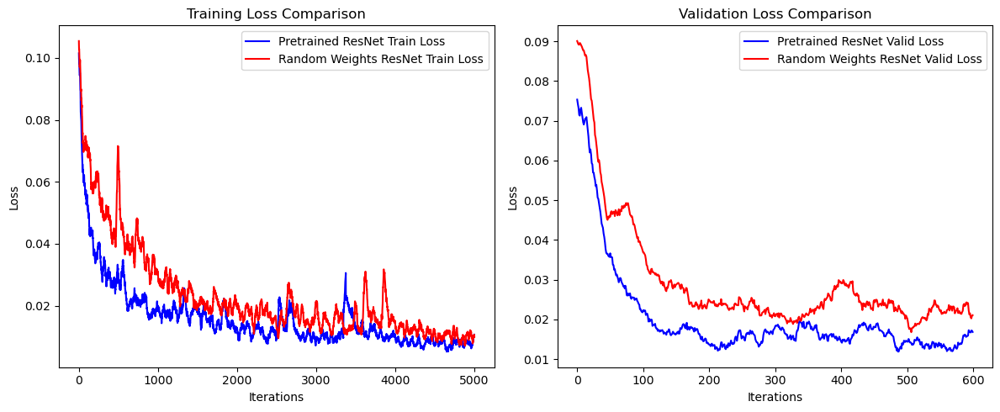

In [29]:
# Compare the pretrained and random weights models
compare_models(ResnetPTMtrainer, ResnetRWMtrainer, "Pretrained ResNet", "Random Weights ResNet")

###### Insights:
The pretrained model losses are reducing more over time compared to Random Weights Resnet losses hence Pretrained model iswprking better.

### Dotted graph for similar comparison:

In [30]:
import matplotlib.pyplot as plt

def compare_models(trainer1, trainer2, trainer1_name="Pretrained", trainer2_name="Random Weights"):
    """ Compare two training instances """
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    # Scatter plot for training loss
    ax[0].scatter(range(len(trainer1.train_loss)), trainer1.train_loss, label=f"{trainer1_name} Train Loss", color='blue', marker='.')
    ax[0].scatter(range(len(trainer2.train_loss)), trainer2.train_loss, label=f"{trainer2_name} Train Loss", color='red', marker='.')
    ax[0].set_title("Training Loss Comparison")
    ax[0].set_xlabel("Iterations")
    ax[0].set_ylabel("Loss")
    ax[0].legend()

    # Scatter plot for validation loss
    ax[1].scatter(range(len(trainer1.valid_loss)), trainer1.valid_loss, label=f"{trainer1_name} Valid Loss", color='blue', marker='.')
    ax[1].scatter(range(len(trainer2.valid_loss)), trainer2.valid_loss, label=f"{trainer2_name} Valid Loss", color='red', marker='.')
    ax[1].set_title("Validation Loss Comparison")
    ax[1].set_xlabel("Iterations")
    ax[1].set_ylabel("Loss")
    ax[1].legend()

    plt.tight_layout()
    plt.show()


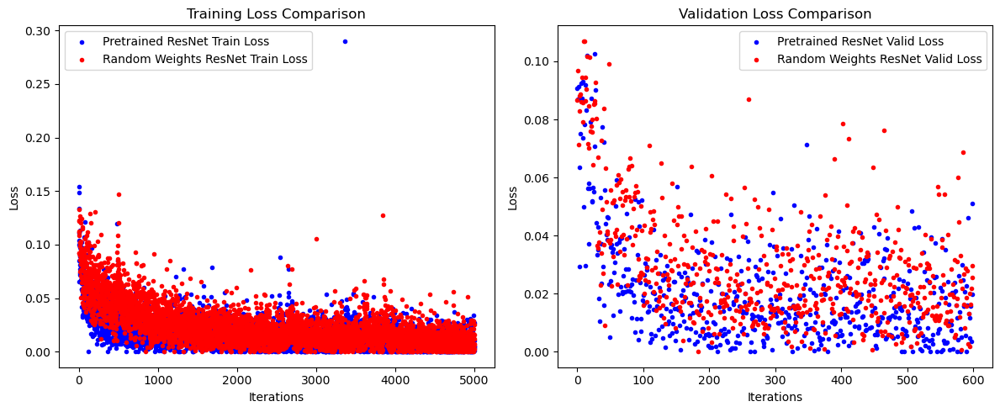

In [31]:
# Compare the pretrained and random weights models
compare_models(ResnetPTMtrainer, ResnetRWMtrainer, "Pretrained ResNet", "Random Weights ResNet")

Pretrained model's training loss (blue) starts at a much lower value compared to Random Wt-Red. it shows a better initial understanding due to knowledge gained from the data it was pretrained on.

the pretrained model's loss decreases at a faster rate and stays consistently lower than that of the random weights model shows better learning in this case.

Validation Loss also=>pretrained model generalizes better to new, unseen data  because it stays lower.

Random weights model's validation loss =>higher variance and does not decrease as smoothly as the pretrained model's loss. Can be overfitting or less effective learning process.

## Visualizing Embeddings

In [32]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [33]:
(img,_,_),(lbl,_,_) = next(iter(test_loader))

/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


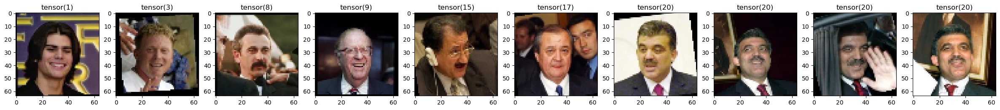

In [34]:
fig, ax = plt.subplots(1, 10, figsize=(30, 3))

for i in range(10):
    # Permute the tensor to be in (H, W, C) format
    img_to_show = img[i].permute(1, 2, 0).numpy()
    img_to_show = np.clip(img_to_show, 0, 1)  # Ensure the image data is between [0, 1]

    ax[i].imshow(img_to_show)
    ax[i].set_title("tensor({})".format(lbl[i].item()))

plt.show()


In [35]:
# model = trainer.model
# pretrained 
PTMdevice = ResnetPTMtrainer.device
PTMmodel = resnetPreTrainedModel.eval()
# random weights
RWMdevice = ResnetRWMtrainer.device
RWMmodel = resnetRandomWeightsModel.eval()

In [36]:
# pretrained

PTMimgs_flat = []
PTMembs = []
PTMlabels = []
with torch.no_grad():
    for (anchor, _, _), (lbl,_, _) in test_loader:
        anchor = anchor.to(PTMdevice)
        anchor_emb = PTMmodel.forward_one(anchor)
        
        PTMlabels.append(lbl)
        PTMembs.append(anchor_emb.cpu())
        PTMimgs_flat.append(anchor.cpu().flatten(1))

PTMlabels = np.concatenate(PTMlabels)
PTMembs = np.concatenate(PTMembs)
PTMimgs_flat = np.concatenate(PTMimgs_flat)

# random weights

RWMimgs_flat = []
RWMembs = []
RWMlabels = []
with torch.no_grad():
    for (anchor, _, _), (lbl,_, _) in test_loader:
        anchor = anchor.to(RWMdevice)
        anchor_emb = RWMmodel.forward_one(anchor)
        
        RWMlabels.append(lbl)
        RWMembs.append(anchor_emb.cpu())
        RWMimgs_flat.append(anchor.cpu().flatten(1))

RWMlabels = np.concatenate(RWMlabels)
RWMembs = np.concatenate(RWMembs)
RWMimgs_flat = np.concatenate(RWMimgs_flat)

In [37]:
PTMpca_imgs = PCA(n_components=2).fit_transform(PTMimgs_flat)
PTMpca_embs = PCA(n_components=2).fit_transform(PTMembs)

RWMpca_imgs = PCA(n_components=2).fit_transform(RWMimgs_flat)
RWMpca_embs = PCA(n_components=2).fit_transform(RWMembs)

1711


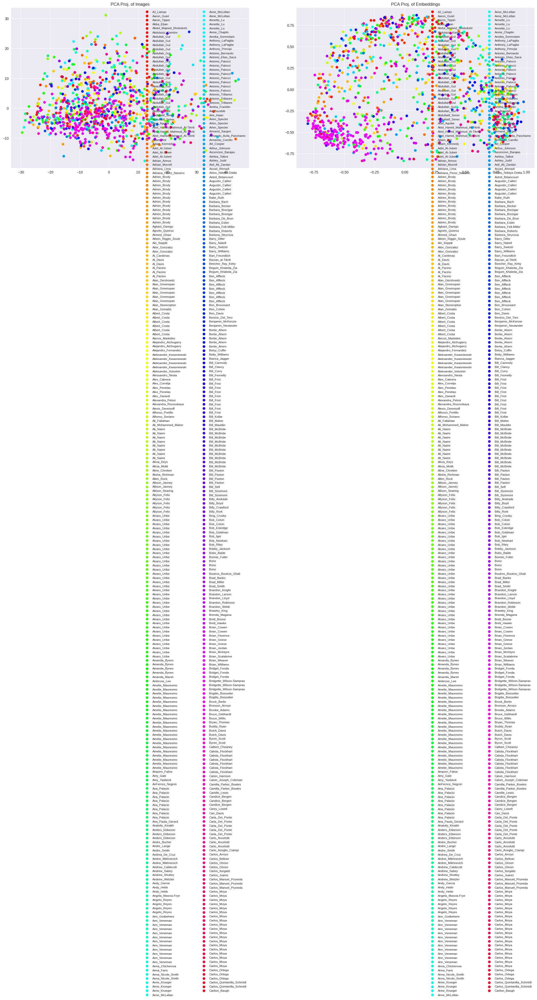

1711


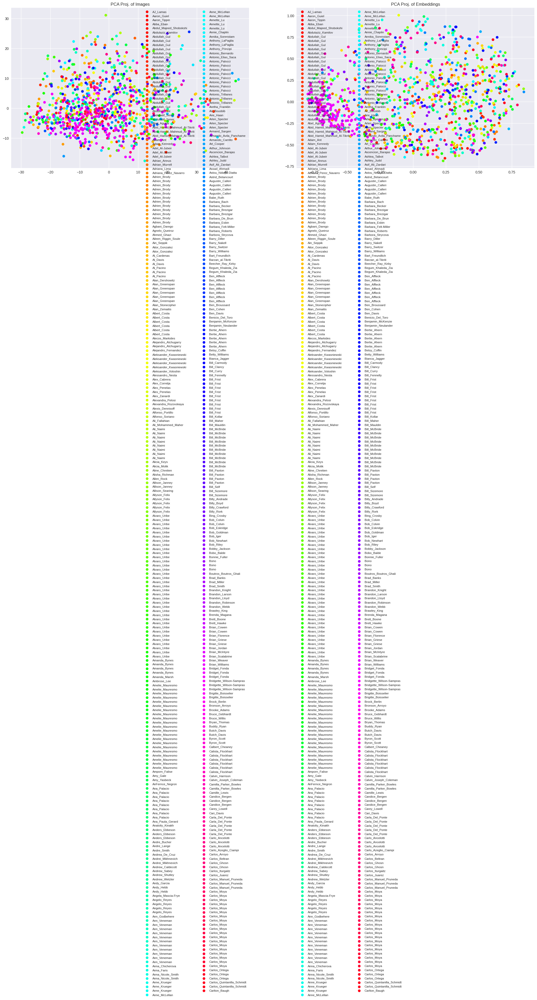

In [38]:
# pretrained
N = 1000
# Get the mapping from class index to class labels
idx_to_class = {v: k for k, v in test_dataset.dataset.class_to_idx.items()}

# Assuming that 'labels' contains numeric indices for the classes
PTMlabel_names_for_plot = [idx_to_class[lbl] for lbl in PTMlabels]
PTMlength = np.unique(PTMlabel_names_for_plot)
print(len(PTMlength))
# Now you can call your display_projections function with the correct legends
plt.style.use('seaborn')
fig,ax = plt.subplots(1,2,figsize=(26,8))
display_projections(PTMpca_imgs[:N], PTMlabels[:N], ax=ax[0], legend=PTMlabel_names_for_plot)
ax[0].set_title("PCA Proj. of Images")
display_projections(PTMpca_embs[:N], PTMlabels[:N], ax=ax[1], legend=PTMlabel_names_for_plot)
ax[1].set_title("PCA Proj. of Embeddings")

plt.show()

# Random Weights

# Get the mapping from class index to class labels
idx_to_class = {v: k for k, v in test_dataset.dataset.class_to_idx.items()}

# Assuming that 'labels' contains numeric indices for the classes
RWMlabel_names_for_plot = [idx_to_class[lbl] for lbl in RWMlabels]
RWMlength = np.unique(RWMlabel_names_for_plot)
print(len(RWMlength))
# Now you can call your display_projections function with the correct legends
plt.style.use('seaborn')
fig,ax = plt.subplots(1,2,figsize=(26,8))
display_projections(RWMpca_imgs[:N], RWMlabels[:N], ax=ax[0], legend=RWMlabel_names_for_plot)
ax[0].set_title("PCA Proj. of Images")
display_projections(RWMpca_embs[:N], RWMlabels[:N], ax=ax[1], legend=RWMlabel_names_for_plot)
ax[1].set_title("PCA Proj. of Embeddings")

plt.show()


PCA Analysis:

1.Both plots show a wide distribution of points =>good spread of the high-dimensional data.Shows diverse dataset with high variance.
2.In both plots, there are no tight clusters forming distinct, well-separated groups but seen some overlap.It can mean similarities among different classes rather than clear-cut distinctions.
3.The dense areas of different colors =>network has difficulty differentiating between classes.

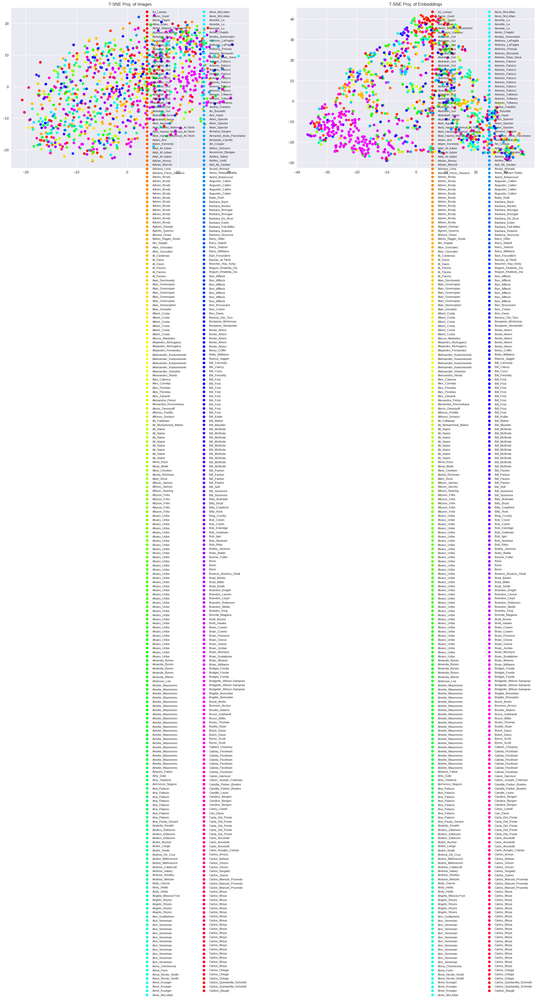

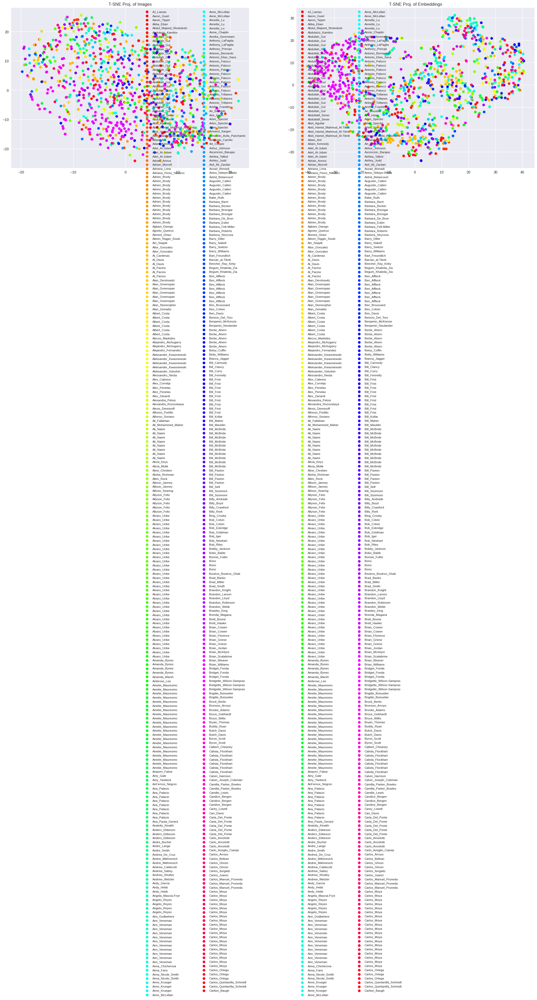

In [39]:
# pretrained

N = 1000
PTMtsne_imgs = TSNE(n_components=2).fit_transform(PTMimgs_flat[:N])
PTMtsne_embs = TSNE(n_components=2).fit_transform(PTMembs[:N])

# Create the label names for plot based on the numeric labels
# This requires a mapping from numeric labels to class names
idx_to_class = {v: k for k, v in test_dataset.dataset.class_to_idx.items()}
PTMlabel_names_for_plot = [idx_to_class[lbl] for lbl in PTMlabels[:N]]

fig, ax = plt.subplots(1, 2, figsize=(26, 8))
# Use the display_projections function to plot, passing in the correct legends
display_projections(PTMtsne_imgs, PTMlabels[:N], ax=ax[0], legend=PTMlabel_names_for_plot)
ax[0].set_title("T-SNE Proj. of Images")
display_projections(PTMtsne_embs, PTMlabels[:N], ax=ax[1], legend=PTMlabel_names_for_plot)
ax[1].set_title("T-SNE Proj. of Embeddings")

plt.show()

# random weights

RWMtsne_imgs = TSNE(n_components=2).fit_transform(RWMimgs_flat[:N])
RWMtsne_embs = TSNE(n_components=2).fit_transform(RWMembs[:N])

# Create the label names for plot based on the numeric labels
# This requires a mapping from numeric labels to class names
idx_to_class = {v: k for k, v in test_dataset.dataset.class_to_idx.items()}
RWMlabel_names_for_plot = [idx_to_class[lbl] for lbl in RWMlabels[:N]]

fig, ax = plt.subplots(1, 2, figsize=(26, 8))
# Use the display_projections function to plot, passing in the correct legends
display_projections(RWMtsne_imgs, RWMlabels[:N], ax=ax[0], legend=RWMlabel_names_for_plot)
ax[0].set_title("T-SNE Proj. of Images")
display_projections(RWMtsne_embs, RWMlabels[:N], ax=ax[1], legend=RWMlabel_names_for_plot)
ax[1].set_title("T-SNE Proj. of Embeddings")

plt.show()

In TSNE =>there's intermixing of different colors, indicating that for many classes, the embeddings are not entirely separable from each other. we believe this could be due to shared features among these classes or a more complex relationship hidden within them that is not separtable linearly.

t-SNE Plot of Embeddings:shows a clearer pattern or trajectory, it shows a more meaningful ordering or relationship among the classes. 


## Clustering

In [40]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [41]:
# pretrained

PTMkmeans_imgs = KMeans(n_clusters=10, random_state=0).fit(PTMimgs_flat)
PTMkmeans_embs = KMeans(n_clusters=10, random_state=0).fit(PTMembs)

# random weights
RWMkmeans_imgs = KMeans(n_clusters=10, random_state=0).fit(RWMimgs_flat)
RWMkmeans_embs = KMeans(n_clusters=10, random_state=0).fit(RWMembs)


/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1

In [42]:
# pretrained

PTMari_imgs = adjusted_rand_score(PTMlabels, PTMkmeans_imgs.labels_)
PTMari_embs = adjusted_rand_score(PTMlabels, PTMkmeans_embs.labels_)

# random weights

RWMari_imgs = adjusted_rand_score(RWMlabels, RWMkmeans_imgs.labels_)
RWMari_embs = adjusted_rand_score(RWMlabels, RWMkmeans_embs.labels_)

In [43]:
# pretrained

print(f"Clustering images achieves  ARI in Pretrained Model={round(PTMari_imgs*100,2)}%")
print(f"Clustering embeddings achieves ARI in Pretrained Model={round(PTMari_embs*100,2)}%")

# random weights
print(f"Clustering images achieves  ARI in random weights Model={round(RWMari_imgs*100,2)}%")
print(f"Clustering embeddings achieves ARI in random weights Model={round(RWMari_embs*100,2)}%")

Clustering images achieves  ARI in Pretrained Model=0.54%
Clustering embeddings achieves ARI in Pretrained Model=2.45%
Clustering images achieves  ARI in random weights Model=0.54%
Clustering embeddings achieves ARI in random weights Model=2.42%


In [44]:
# pretrained
print(f"Compression ratio of Pretrained Model: {PTMembs.shape[-1]}/{PTMimgs_flat.shape[-1]}  = {round(PTMembs.shape[-1]/PTMimgs_flat.shape[-1] * 100, 2)}%")

# random weights
print(f"Compression ratio of random weights Model: {RWMembs.shape[-1]}/{RWMimgs_flat.shape[-1]}  = {round(RWMembs.shape[-1]/RWMimgs_flat.shape[-1] * 100, 2)}%")


Compression ratio of Pretrained Model: 32/12288  = 0.26%
Compression ratio of random weights Model: 32/12288  = 0.26%


## Nice Visualization

In [45]:
def display_projections_images(points, labels, dataset, ax=None, legend=None):
    """ Displaying low-dimensional data projections using images instead of points """
    from matplotlib.offsetbox import OffsetImage, AnnotationBbox
    COLORS = ['r', 'b', 'g', 'y', 'purple', 'orange', 'k', 'brown', 'grey',
              'c', "gold", "fuchsia", "lime", "darkred", "tomato", "navy"]
    
    legend = [f"Class {l}" for l in np.unique(labels)] if legend is None else legend
    _, ax = plt.subplots(1,1,figsize=(36,24))
    
    for l in np.unique(labels):
        idx = np.where(l==labels)
        ax.scatter(points[idx, 0], points[idx, 1], label=legend[int(l)], color=COLORS[l]) 

    for i, point in enumerate(points):
        xy = [point[0], point[1]]
        
        arr_img = dataset[i][0][0][0]
        l = labels[i]
        imagebox = OffsetImage(arr_img, zoom=1)
        imagebox.image.axes = ax
        ab = AnnotationBbox(imagebox, xy,
                            xybox=(0, 0),
                            xycoords='data',
                            boxcoords="offset points",
                            pad=0.1,
                            bboxprops=dict(edgecolor=COLORS[l], lw=2)
                            )

        ax.add_artist(ab)
    ax.legend(loc="best")
    plt.show()

In [46]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.cm as cm

def display_projections_images(points, labels, dataset, ax=None, legend=None, zoom=0.3):
    if ax is None:
        _, ax = plt.subplots(figsize=(36, 24))

    # Generate a colormap based on the number of unique labels
    unique_labels = np.unique(labels)
    color_map = cm.get_cmap('hsv', len(unique_labels))
    
    # Get colors from the color map
    colors = [color_map(i / len(unique_labels)) for i in range(len(unique_labels))]

    # Create a dictionary to map labels to colors
    label_to_color = {label: colors[i] for i, label in enumerate(unique_labels)}
    
    # Plot each image
    for i, (point, label) in enumerate(zip(points, labels)):
        xy = (point[0], point[1])
        color = label_to_color[label]
        
        # Get the image tensor from the dataset
        img_tensor = dataset[i][0]
        if isinstance(img_tensor, tuple):
            img_tensor = img_tensor[0]  # If the dataset[i][0] is a tuple, get the first element

        # Convert the tensor to an image
        arr_img = img_tensor.permute(1, 2, 0).numpy()
        arr_img = (arr_img - arr_img.min()) / (arr_img.max() - arr_img.min())  # Normalize

        imagebox = OffsetImage(arr_img, zoom=zoom)
        imagebox.image.axes = ax

        # Create an annotation box
        ab = AnnotationBbox(imagebox, xy,
                            xybox=(0., 0.),
                            xycoords='data',
                            boxcoords="offset points",
                            pad=0,
                            frameon=True,
                            bboxprops=dict(edgecolor=color, lw=2))
        
        ax.add_artist(ab)
    
    # Optionally, add a scatter plot of points for the legend
    for label in unique_labels:
        ax.scatter([], [], c=[label_to_color[label]], label=str(label))
    
    # Optionally, add the legend outside the plot
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Classes')

    ax.update_datalim(points)
    ax.autoscale()
    plt.show()

In [47]:
print("Graph for pretrained Model")
display_projections_images(points=PTMtsne_embs[:2000], labels=PTMlabels[:2000], dataset=test_dataset)

print("Graph for Random Weights Model")
display_projections_images(points=RWMtsne_embs[:2000], labels=RWMlabels[:2000], dataset=test_dataset)

Graph for pretrained Model


/home/user/asifa0/anaconda3/envs/CudaLab/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Graph for Random Weights Model


Pre trained model have a better cluster compared to Random weight model.pretrained model has a better starting point for learning the specifics of the new data

For Random Weight>The lack of distinct clusters => not effective at grouping similar images close to each other in the embedding space.

However to an extend we believe similar images are grouped near to each other.

## The best of the above models, but using semi-hard negative mining strategy: 
(https://arxiv.org/abs/1503.03832)